In [ ]:
print("Installing dependencies (2-3 minutes)...")

# 1. Update pip and basic build tools first
!pip install -U -q pip setuptools wheel

# 2. Install core libraries (removed xformers from here to avoid conflicts)
!pip install -q diffusers[torch]==0.25.0
!pip install -q transformers==4.37.2  # Changed from 5.0.0 (v5 is not standard yet)
!pip install -q accelerate==0.25.0
!pip install -q peft==0.7.1
!pip install -q bitsandbytes==0.41.3

# 3. Install the correct xformers wheel for Colab's specific Torch/CUDA version
!pip install -U -q xformers --index-url https://download.pytorch.org/whl/cu121

print("✓ Installation complete!")
import torch
print(f"PyTorch: {torch.__version__}")
print(f"CUDA available: {torch.cuda.is_available()}")
if torch.cuda.is_available():
    print(f"GPU: {torch.cuda.get_device_name(0)}")

Installing dependencies (2-3 minutes)...
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.8/1.8 MB 84.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 80.2 MB/s eta 0:00:00
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
ipython 7.34.0 requires jedi>=0.16, which is not installed.
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
sentence-transformers 5.2.2 requires transformers<6.0.0,>=4.41.0, but you have transformers 4.37.2 which is incompatible.
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
torchvision 0.24.0+cu126 requires torch==2.9.0, but you have torch 2.5.1+cu121 which is incompatib

In [ ]:
# 1. Update pip and install basic build tools
!pip install -U -q pip setuptools wheel

# 2. Install core libraries (Allowing flexible versions to avoid conflicts)
!pip install -q diffusers[torch] transformers accelerate peft bitsandbytes sentence-transformers jedi

# 3. Install xformers (Using the pre-built wheel for Colab's CUDA version)
# This prevents the "Failed building wheel" error.
!pip install -U -q xformers --index-url https://download.pytorch.org/whl/cu121

print("✅ Installation complete!")

import torch
print(f"PyTorch: {torch.__version__}")
print(f"CUDA available: {torch.cuda.is_available()}")
if torch.cuda.is_available():
    print(f"GPU: {torch.cuda.get_device_name(0)}")

✅ Installation complete!
PyTorch: 2.9.0+cu126
CUDA available: True
GPU: Tesla T4


In [ ]:
!pip install -q transformers==5.0.0


In [ ]:
# ============================================
# Cell 2: Mount Drive & Upload Dataset
# ============================================
from google.colab import drive, files
import os

# Mount Google Drive
drive.mount('/content/drive')

# Create working directory
os.makedirs('/content/anime-harmony', exist_ok=True)
os.chdir('/content/anime-harmony')

print("\nUpload your curated.zip file:")
print("(This should be from data/curated.zip)")
uploaded = files.upload()

# Extract dataset
!unzip -q curated.zip
print("\n✓ Dataset extracted")

# Verify structure
print("\nDataset structure:")
!find curated -type f -name "*.txt" | head -10
!echo ""
!echo "Total images:"
!find curated -type f \( -name "*.png" -o -name "*.jpg" -o -name "*.jpeg" \) | wc -l
!echo "Total captions:"
!find curated -type f -name "*.txt" | wc -l

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).

Upload your curated.zip file:
(This should be from data/curated.zip)


Saving curated.zip to curated (2).zip
replace curated/energetic/angry/fujiwara-angry-001.jpg? [y]es, [n]o, [A]ll, [N]one, [r]ename: A

✓ Dataset extracted

Dataset structure:
curated/soft/sad/gojo-sad-004.txt
curated/soft/sad/hinata-sad-001.txt
curated/soft/sad/armin-sad-002.txt
curated/soft/sad/miku-sad-004.txt
curated/soft/sad/armin-sad-003.txt
curated/soft/sad/gojo-sad-001.txt
curated/soft/sad/gojo-sad-002.txt
curated/soft/sad/gojo-sad-003.txt
curated/soft/sad/hinata-sad-004.txt
curated/soft/sad/miku-sad-001.txt

Total images:
416
Total captions:
417


In [ ]:
import torch
import torchvision
import transformers
import os

print(f"PyTorch: {torch.__version__}")
print(f"torchvision: {torchvision.__version__}")
print(f"transformers: {transformers.__version__}")
print(f"CUDA available: {torch.cuda.is_available()}")

PyTorch: 2.10.0+cu128
torchvision: 0.25.0+cu128
transformers: 5.0.0
CUDA available: True


In [ ]:
!pip install --upgrade transformers==5.0.0
!pip install --force-reinstall torchvision

  Using cached setuptools-80.10.2-py3-none-any.whl.metadata (6.6 kB)
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 8.1/8.1 MB 125.4 MB/s  0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 915.7/915.7 MB 13.1 MB/s  0:00:28
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 12.2/12.2 MB 145.2 MB/s  0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 594.3/594.3 MB 17.0 MB/s  0:00:17
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 10.2/10.2 MB 121.3 MB/s  0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 88.0/88.0 MB 72.8 MB/s  0:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 954.8/954.8 kB 62.3 MB/s  0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 706.8/706.8 MB 11.4 MB/s  0:00:33
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 193.1/193.1 MB 34.0 MB/s  0:00:05
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.2/1.2 MB 69.9 MB/s  0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 63.6/63.6 MB 68.6 MB/s  0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 267.5/267.5 MB 15.7 MB/s  0:00:16
   ━━━━━

In [ ]:
!find /content -maxdepth 4 -type d


/content
/content/.config
/content/.config/logs
/content/.config/logs/2025.12.09
/content/.config/configurations
/content/anime-harmony
/content/anime-harmony/curated
/content/anime-harmony/curated/soft
/content/anime-harmony/curated/soft/sad
/content/anime-harmony/curated/soft/happy
/content/anime-harmony/curated/soft/neutral
/content/anime-harmony/curated/soft/angry
/content/anime-harmony/curated/stoic
/content/anime-harmony/curated/stoic/sad
/content/anime-harmony/curated/stoic/happy
/content/anime-harmony/curated/stoic/neutral
/content/anime-harmony/curated/stoic/angry
/content/anime-harmony/curated/energetic
/content/anime-harmony/curated/energetic/sad
/content/anime-harmony/curated/energetic/happy
/content/anime-harmony/curated/energetic/neutral
/content/anime-harmony/curated/energetic/angry
/content/anime-harmony/curated/melancholic
/content/anime-harmony/curated/melancholic/sad
/content/anime-harmony/curated/melancholic/happy
/content/anime-harmony/curated/melancholic/neutral
/

In [ ]:
len(curated)

NameError: name 'curated' is not defined

In [ ]:
# ================================================
# Cell 3: Configuration
# ================================================

# Paths
DATASET_PATH = "/content/anime-harmony/curated"  # ← Change this line
OUTPUT_DIR = "lora_output"
MODEL_ID = "runwayml/stable-diffusion-v1-5"

# LoRA Hyperparameters (optimized for your dataset)
LORA_CONFIG = {
    'rank': 16,              # Low rank for subtle style changes
    'alpha': 32,             # Learning rate multiplier
    'dropout': 0.1,          # Prevent overfitting
    'target_modules': ["to_k", "to_q", "to_v", "to_out.0"]  # U-Net attention
}

# Training Hyperparameters
TRAIN_CONFIG = {
    'batch_size': 2,                    # Small batch for stability
    'gradient_accumulation': 8,         # Effective batch = 16
    'learning_rate': 5e-5,              # Conservative LR
    'num_epochs': 12,                   # ~3 hours on T4
    'save_every': 200,                  # Checkpoint frequency
    'mixed_precision': 'fp16',          # Speed up training
    'image_size': 512,
    'max_grad_norm': 1.0,
}

# Create output directory
os.makedirs(OUTPUT_DIR, exist_ok=True)

print("Configuration:")
print(f"  Dataset: {DATASET_PATH}")
print(f"  LoRA Rank: {LORA_CONFIG['rank']}")
print(f"  Batch Size: {TRAIN_CONFIG['batch_size']}")
print(f"  Gradient Accumulation: {TRAIN_CONFIG['gradient_accumulation']}")
print(f"  Effective Batch Size: {TRAIN_CONFIG['batch_size'] * TRAIN_CONFIG['gradient_accumulation']}")
print(f"  Epochs: {TRAIN_CONFIG['num_epochs']}")
print(f"  Learning Rate: {TRAIN_CONFIG['learning_rate']}")

Configuration:
  Dataset: /content/anime-harmony/curated
  LoRA Rank: 16
  Batch Size: 2
  Gradient Accumulation: 8
  Effective Batch Size: 16
  Epochs: 12
  Learning Rate: 5e-05


In [ ]:
l

7

In [ ]:
# ============================================
# Cell 4: Dataset Class
# ============================================

from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
from PIL import Image
from pathlib import Path
import random

class HarmonyDataset(Dataset):
    def __init__(self, data_dir, size=512):
        self.data_dir = Path(data_dir)
        self.size = size

        # Find all image-caption pairs
        self.samples = []
        for ext in ['*.png', '*.jpg', '*.jpeg', '*.webp']:
            for img_path in self.data_dir.rglob(ext):
                txt_path = img_path.with_suffix('.txt')
                if txt_path.exists():
                    self.samples.append((img_path, txt_path))

        # Transforms with augmentation
        self.transform = transforms.Compose([
            transforms.Resize(size, interpolation=transforms.InterpolationMode.BILINEAR),
            transforms.CenterCrop(size),
            transforms.RandomHorizontalFlip(p=0.5),  # Data augmentation
            transforms.ToTensor(),
            transforms.Normalize([0.5], [0.5])
        ])

        print(f"✓ Dataset loaded: {len(self.samples)} image-caption pairs")

        # Show distribution
        archetypes = {}
        for img_path, _ in self.samples:
            archetype = img_path.parent.parent.name
            archetypes[archetype] = archetypes.get(archetype, 0) + 1

        print("\nDistribution:")
        for arch, count in sorted(archetypes.items()):
            print(f"  {arch}: {count}")

    def __len__(self):
        return len(self.samples)

    def __getitem__(self, idx):
        img_path, txt_path = self.samples[idx]

        # Load and transform image
        image = Image.open(img_path).convert('RGB')
        image = self.transform(image)

        # Load caption
        with open(txt_path, 'r', encoding='utf-8') as f:
            caption = f.read().strip()

        return {'image': image, 'caption': caption}

# Create dataset and dataloader
dataset = HarmonyDataset(DATASET_PATH, size=TRAIN_CONFIG['image_size'])

dataloader = DataLoader(
    dataset,
    batch_size=TRAIN_CONFIG['batch_size'],
    shuffle=True,
    num_workers=2,
    pin_memory=True
)

print(f"\n✓ DataLoader ready: {len(dataloader)} batches per epoch")

✓ Dataset loaded: 417 image-caption pairs

Distribution:
  energetic: 107
  melancholic: 84
  soft: 64
  stoic: 162

✓ DataLoader ready: 209 batches per epoch


In [ ]:
# ============================================
# Cell 5: Load Model & Apply LoRA
# ============================================

from diffusers import StableDiffusionPipeline, AutoencoderKL, UNet2DConditionModel, DDPMScheduler
from transformers import CLIPTextModel, CLIPTokenizer
from peft import LoraConfig, get_peft_model, TaskType

print("Loading Stable Diffusion model...")
print("(This will take 2-3 minutes on first run)")

# Load components separately for training
tokenizer = CLIPTokenizer.from_pretrained(MODEL_ID, subfolder="tokenizer")
text_encoder = CLIPTextModel.from_pretrained(MODEL_ID, subfolder="text_encoder").to("cuda")
vae = AutoencoderKL.from_pretrained(MODEL_ID, subfolder="vae").to("cuda")
unet = UNet2DConditionModel.from_pretrained(MODEL_ID, subfolder="unet").to("cuda")
noise_scheduler = DDPMScheduler.from_pretrained(MODEL_ID, subfolder="scheduler")

print("✓ Base model loaded")

# Freeze VAE and text encoder (only train UNet)
vae.requires_grad_(False)
text_encoder.requires_grad_(False)

# Apply LoRA to UNet
lora_config = LoraConfig(
    r=LORA_CONFIG['rank'],
    lora_alpha=LORA_CONFIG['alpha'],
    init_lora_weights="gaussian",
    target_modules=LORA_CONFIG['target_modules'],
    lora_dropout=LORA_CONFIG['dropout'],
)

unet = get_peft_model(unet, lora_config)
unet.print_trainable_parameters()

print("\n✓ LoRA applied to UNet")

    PyTorch 2.5.1+cu121 with CUDA 1201 (you have 2.10.0+cu128)
    Python  3.12.8 (you have 3.12.12)
  Please reinstall xformers (see https://github.com/facebookresearch/xformers#installing-xformers)
  Memory-efficient attention, SwiGLU, sparse and more won't be available.
  Set XFORMERS_MORE_DETAILS=1 for more details
Flax classes are deprecated and will be removed in Diffusers v1.0.0. We recommend migrating to PyTorch classes or pinning your version of Diffusers.
Flax classes are deprecated and will be removed in Diffusers v1.0.0. We recommend migrating to PyTorch classes or pinning your version of Diffusers.


Loading Stable Diffusion model...
(This will take 2-3 minutes on first run)


/usr/local/lib/python3.12/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


tokenizer_config.json:   0%|          | 0.00/806 [00:00<?, ?B/s]

vocab.json: 0.00B [00:00, ?B/s]

merges.txt: 0.00B [00:00, ?B/s]

special_tokens_map.json:   0%|          | 0.00/472 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/617 [00:00<?, ?B/s]

text_encoder/model.safetensors:   0%|          | 0.00/492M [00:00<?, ?B/s]

Loading weights:   0%|          | 0/196 [00:00<?, ?it/s]

CLIPTextModel LOAD REPORT from: runwayml/stable-diffusion-v1-5
Key                                | Status     |  | 
-----------------------------------+------------+--+-
text_model.embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.
/usr/local/lib/python3.12/dist-packages/huggingface_hub/utils/_validators.py:202: UserWarning: The `local_dir_use_symlinks` argument is deprecated and ignored in `hf_hub_download`. Downloading to a local directory does not use symlinks anymore.
  warnings.warn(


config.json:   0%|          | 0.00/547 [00:00<?, ?B/s]

vae/diffusion_pytorch_model.safetensors:   0%|          | 0.00/335M [00:00<?, ?B/s]

config.json:   0%|          | 0.00/743 [00:00<?, ?B/s]

unet/diffusion_pytorch_model.safetensors:   0%|          | 0.00/3.44G [00:00<?, ?B/s]

scheduler_config.json:   0%|          | 0.00/308 [00:00<?, ?B/s]

✓ Base model loaded
trainable params: 3,188,736 || all params: 862,709,700 || trainable%: 0.3696

✓ LoRA applied to UNet


In [ ]:
# Option 1: Reinstall bitsandbytes with proper CUDA support
!pip uninstall -y bitsandbytes
!pip install bitsandbytes==0.41.1

# Restart runtime

Found existing installation: bitsandbytes 0.41.3
Uninstalling bitsandbytes-0.41.3:
  Successfully uninstalled bitsandbytes-0.41.3
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 92.6/92.6 MB 27.5 MB/s  0:00:03


In [ ]:
# Install compatible versions
!pip install diffusers==0.25.0
!pip install huggingface_hub==0.20.3
!pip install transformers==5.0.0
!pip install peft==0.8.2
!pip install accelerate

# Restart runtime after this

  Attempting uninstall: huggingface_hub
    Found existing installation: huggingface_hub 1.4.0
    Uninstalling huggingface_hub-1.4.0:
      Successfully uninstalled huggingface_hub-1.4.0
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
transformers 5.0.0 requires huggingface-hub<2.0,>=1.3.0, but you have huggingface-hub 0.20.3 which is incompatible.
gradio 5.50.0 requires huggingface-hub<2.0,>=0.33.5, but you have huggingface-hub 0.20.3 which is incompatible.
gradio 5.50.0 requires pillow<12.0,>=8.0, but you have pillow 12.1.0 which is incompatible.
datasets 4.0.0 requires fsspec[http]<=2025.3.0,>=2023.1.0, but you have fsspec 2026.1.0 which is incompatible.
datasets 4.0.0 requires huggingface-hub>=0.24.0, but you have huggingface-hub 0.20.3 which is incompatible.
  Using cached huggingface_hub-1.4.0-py3-none-any.whl.metadata (13 kB)
Using cached huggingface_hu

In [ ]:
# Just verify everything imports correctly
import diffusers
import transformers
import peft
import torch

print(f"✓ diffusers: {diffusers.__version__}")
print(f"✓ transformers: {transformers.__version__}")
print(f"✓ peft: {peft.__version__}")
print(f"✓ torch: {torch.__version__}")
print(f"✓ CUDA available: {torch.cuda.is_available()}")

ImportError: cannot import name 'cached_download' from 'huggingface_hub' (/usr/local/lib/python3.12/dist-packages/huggingface_hub/__init__.py)

In [ ]:
# Uninstall conflicting packages and reinstall with compatible versions
!pip uninstall -y diffusers huggingface_hub transformers peft datasets gradio pillow fsspec

# Install compatible versions that work together
!pip install huggingface-hub==0.26.0
!pip install diffusers==0.25.0
!pip install transformers==5.0.0
!pip install peft==0.8.2
!pip install accelerate==0.25.0
!pip install pillow==11.0.0
!pip install fsspec==2024.6.1
!pip install datasets==3.0.0

# Then restart runtime

Found existing installation: diffusers 0.25.0
Uninstalling diffusers-0.25.0:
  Successfully uninstalled diffusers-0.25.0
Found existing installation: huggingface_hub 1.4.0
Uninstalling huggingface_hub-1.4.0:
  Successfully uninstalled huggingface_hub-1.4.0
Found existing installation: transformers 5.0.0
Uninstalling transformers-5.0.0:
  Successfully uninstalled transformers-5.0.0
Found existing installation: peft 0.8.2
Uninstalling peft-0.8.2:
  Successfully uninstalled peft-0.8.2
Found existing installation: datasets 3.0.0
Uninstalling datasets-3.0.0:
  Successfully uninstalled datasets-3.0.0
Found existing installation: pillow 11.0.0
Uninstalling pillow-11.0.0:
  Successfully uninstalled pillow-11.0.0
Found existing installation: fsspec 2024.6.1
Uninstalling fsspec-2024.6.1:
  Successfully uninstalled fsspec-2024.6.1
  Using cached huggingface_hub-0.26.0-py3-none-any.whl.metadata (13 kB)
  Using cached fsspec-2026.1.0-py3-none-any.whl.metadata (10 kB)
Using cached huggingface_hub-0.

  Using cached diffusers-0.25.0-py3-none-any.whl.metadata (19 kB)
  Using cached pillow-12.1.0-cp312-cp312-manylinux_2_27_x86_64.manylinux_2_28_x86_64.whl.metadata (8.8 kB)
Using cached diffusers-0.25.0-py3-none-any.whl (1.8 MB)
Using cached pillow-12.1.0-cp312-cp312-manylinux_2_27_x86_64.manylinux_2_28_x86_64.whl (7.0 MB)
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2/2 [diffusers]
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
torchtune 0.6.1 requires datasets, which is not installed.
fastai 2.8.6 requires torch<2.10,>=1.10, but you have torch 2.10.0 which is incompatible.
  Using cached transformers-5.0.0-py3-none-any.whl.metadata (37 kB)
  Using cached huggingface_hub-1.4.0-py3-none-any.whl.metadata (13 kB)
Using cached transformers-5.0.0-py3-none-any.whl (10.1 MB)
Using cached huggingface_hub-1.4.0-py3-none-any.whl (553 kB)
  Attempting uninstall: huggingf

  Using cached fsspec-2024.6.1-py3-none-any.whl.metadata (11 kB)
Using cached fsspec-2024.6.1-py3-none-any.whl (177 kB)
  Attempting uninstall: fsspec
    Found existing installation: fsspec 2026.1.0
    Uninstalling fsspec-2026.1.0:
      Successfully uninstalled fsspec-2026.1.0
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
torchtune 0.6.1 requires datasets, which is not installed.
xformers 0.0.29.post1 requires torch==2.5.1, but you have torch 2.10.0 which is incompatible.
gcsfs 2025.3.0 requires fsspec==2025.3.0, but you have fsspec 2024.6.1 which is incompatible.
fastai 2.8.6 requires torch<2.10,>=1.10, but you have torch 2.10.0 which is incompatible.
torchaudio 2.9.0+cu126 requires torch==2.9.0, but you have torch 2.10.0 which is incompatible.
  Using cached datasets-3.0.0-py3-none-any.whl.metadata (19 kB)
Using cached datasets-3.0.0-py3-none-any.whl (47

In [ ]:
# Uninstall and install compatible versions
!pip uninstall -y diffusers huggingface_hub

# Install newer compatible versions
!pip install huggingface-hub>=0.23.0
!pip install diffusers>=0.27.0

# Restart runtime after this

Found existing installation: diffusers 0.25.0
Uninstalling diffusers-0.25.0:
  Successfully uninstalled diffusers-0.25.0
Found existing installation: huggingface_hub 1.4.0
Uninstalling huggingface_hub-1.4.0:
  Successfully uninstalled huggingface_hub-1.4.0


In [ ]:
# Option 2: Remove bitsandbytes entirely
!pip uninstall -y bitsandbytes

# Restart runtime

Found existing installation: bitsandbytes 0.41.1
Uninstalling bitsandbytes-0.41.1:
  Successfully uninstalled bitsandbytes-0.41.1


In [ ]:
import diffusers
import transformers
import peft
import torch

print(f"✓ diffusers: {diffusers.__version__}")
print(f"✓ transformers: {transformers.__version__}")
print(f"✓ peft: {peft.__version__}")
print(f"✓ torch: {torch.__version__}")
print(f"✓ CUDA available: {torch.cuda.is_available()}")

✓ diffusers: 0.36.0
✓ transformers: 5.0.0
✓ peft: 0.18.1
✓ torch: 2.10.0+cu128
✓ CUDA available: True


In [ ]:
import os

In [ ]:
!pip install --upgrade diffusers transformers peft accelerate huggingface-hub

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 557.0/557.0 kB 21.4 MB/s  0:00:00
  Attempting uninstall: accelerate
    Found existing installation: accelerate 0.25.0
    Uninstalling accelerate-0.25.0:
      Successfully uninstalled accelerate-0.25.0
  Attempting uninstall: peft
    Found existing installation: peft 0.8.2
    Uninstalling peft-0.8.2:
      Successfully uninstalled peft-0.8.2
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2/2 [peft]


In [ ]:
# ============================================
# Cell 6: Training Setup
# ============================================

from accelerate import Accelerator
from tqdm.auto import tqdm
import math

# Initialize accelerator
accelerator = Accelerator(
    gradient_accumulation_steps=TRAIN_CONFIG['gradient_accumulation'],
    mixed_precision=TRAIN_CONFIG['mixed_precision']
)

# Optimizer
optimizer = torch.optim.AdamW(
    unet.parameters(),
    lr=TRAIN_CONFIG['learning_rate'],
    betas=(0.9, 0.999),
    weight_decay=0.01,
    eps=1e-8
)

# Learning rate scheduler (cosine with warmup)
num_training_steps = len(dataloader) * TRAIN_CONFIG['num_epochs']
num_warmup_steps = int(0.1 * num_training_steps)  # 10% warmup

from torch.optim.lr_scheduler import CosineAnnealingLR

lr_scheduler = CosineAnnealingLR(
    optimizer,
    T_max=num_training_steps - num_warmup_steps,
    eta_min=TRAIN_CONFIG['learning_rate'] * 0.1
)

# Prepare for distributed training
unet, optimizer, dataloader, lr_scheduler = accelerator.prepare(
    unet, optimizer, dataloader, lr_scheduler
)

print("✓ Training setup complete")
print(f"  Total training steps: {num_training_steps}")
print(f"  Warmup steps: {num_warmup_steps}")
print(f"  Estimated training time: ~3 hours")

✓ Training setup complete
  Total training steps: 2508
  Warmup steps: 250
  Estimated training time: ~3 hours


In [ ]:
# ============================================
# Cell 7: Training Loop
# ============================================

import time

print(f"\n{'='*70}")
print(f"STARTING TRAINING")
print(f"{'='*70}\n")

global_step = 0
losses = []
start_time = time.time()

unet.train()

for epoch in range(TRAIN_CONFIG['num_epochs']):
    epoch_loss = 0
    progress_bar = tqdm(
        dataloader,
        desc=f"Epoch {epoch+1}/{TRAIN_CONFIG['num_epochs']}",
        disable=not accelerator.is_local_main_process
    )

    for batch_idx, batch in enumerate(progress_bar):
        with accelerator.accumulate(unet):
            # Encode text prompts
            text_inputs = tokenizer(
                batch['caption'],
                padding="max_length",
                max_length=77,
                truncation=True,
                return_tensors="pt"
            ).input_ids.to(accelerator.device)

            with torch.no_grad():
                text_embeddings = text_encoder(text_inputs)[0]

            # Encode images to latent space
            with torch.no_grad():
                latents = vae.encode(batch['image'].to(accelerator.device)).latent_dist.sample()
                latents = latents * 0.18215

            # Sample noise
            noise = torch.randn_like(latents)
            bsz = latents.shape[0]

            # Sample random timesteps
            timesteps = torch.randint(
                0, noise_scheduler.config.num_train_timesteps,
                (bsz,), device=latents.device
            ).long()

            # Add noise to latents
            noisy_latents = noise_scheduler.add_noise(latents, noise, timesteps)

            # Predict noise residual
            noise_pred = unet(noisy_latents, timesteps, text_embeddings).sample

            # Calculate loss
            loss = torch.nn.functional.mse_loss(
                noise_pred.float(), noise.float(), reduction="mean"
            )

            # Backpropagation
            accelerator.backward(loss)

            if accelerator.sync_gradients:
                accelerator.clip_grad_norm_(unet.parameters(), TRAIN_CONFIG['max_grad_norm'])

            optimizer.step()
            lr_scheduler.step()
            optimizer.zero_grad()

        # Logging
        if accelerator.sync_gradients:
            global_step += 1
            epoch_loss += loss.detach().item()
            losses.append(loss.detach().item())

            # Update progress bar
            avg_loss = sum(losses[-100:]) / len(losses[-100:])
            elapsed = time.time() - start_time
            progress_bar.set_postfix({
                'loss': f'{avg_loss:.4f}',
                'lr': f'{lr_scheduler.get_last_lr()[0]:.2e}',
                'time': f'{elapsed/60:.1f}m'
            })

            # Save checkpoint
            if global_step % TRAIN_CONFIG['save_every'] == 0:
                checkpoint_path = f"{OUTPUT_DIR}/checkpoint-{global_step}"
                accelerator.wait_for_everyone()
                unwrapped_unet = accelerator.unwrap_model(unet)
                unwrapped_unet.save_pretrained(checkpoint_path)
                print(f"\n💾 Checkpoint saved: {checkpoint_path}")

    # End of epoch
    avg_epoch_loss = epoch_loss / len(dataloader)
    print(f"\n📊 Epoch {epoch+1} complete - Avg Loss: {avg_epoch_loss:.4f}")

    # Save epoch checkpoint
    epoch_path = f"{OUTPUT_DIR}/epoch-{epoch+1}"
    accelerator.wait_for_everyone()
    unwrapped_unet = accelerator.unwrap_model(unet)
    unwrapped_unet.save_pretrained(epoch_path)
    print(f"💾 Epoch checkpoint saved: {epoch_path}\n")

total_time = time.time() - start_time
print(f"\n{'='*70}")
print(f"✅ TRAINING COMPLETE!")
print(f"{'='*70}")
print(f"Total time: {total_time/60:.1f} minutes ({total_time/3600:.2f} hours)")
print(f"Total steps: {global_step}")
print(f"Final loss: {losses[-1]:.4f}")




STARTING TRAINING



Epoch 1/12:   0%|          | 0/209 [00:00<?, ?it/s]


📊 Epoch 1 complete - Avg Loss: 0.0168
💾 Epoch checkpoint saved: lora_output/epoch-1



Epoch 2/12:   0%|          | 0/209 [00:00<?, ?it/s]


📊 Epoch 2 complete - Avg Loss: 0.0110
💾 Epoch checkpoint saved: lora_output/epoch-2



Epoch 3/12:   0%|          | 0/209 [00:00<?, ?it/s]


📊 Epoch 3 complete - Avg Loss: 0.0149
💾 Epoch checkpoint saved: lora_output/epoch-3



Epoch 4/12:   0%|          | 0/209 [00:00<?, ?it/s]


📊 Epoch 4 complete - Avg Loss: 0.0161
💾 Epoch checkpoint saved: lora_output/epoch-4



Epoch 5/12:   0%|          | 0/209 [00:00<?, ?it/s]


📊 Epoch 5 complete - Avg Loss: 0.0185
💾 Epoch checkpoint saved: lora_output/epoch-5



Epoch 6/12:   0%|          | 0/209 [00:00<?, ?it/s]


📊 Epoch 6 complete - Avg Loss: 0.0086
💾 Epoch checkpoint saved: lora_output/epoch-6



Epoch 7/12:   0%|          | 0/209 [00:00<?, ?it/s]


📊 Epoch 7 complete - Avg Loss: 0.0108
💾 Epoch checkpoint saved: lora_output/epoch-7



Epoch 8/12:   0%|          | 0/209 [00:00<?, ?it/s]


💾 Checkpoint saved: lora_output/checkpoint-200

📊 Epoch 8 complete - Avg Loss: 0.0122
💾 Epoch checkpoint saved: lora_output/epoch-8



Epoch 9/12:   0%|          | 0/209 [00:00<?, ?it/s]


📊 Epoch 9 complete - Avg Loss: 0.0149
💾 Epoch checkpoint saved: lora_output/epoch-9



Epoch 10/12:   0%|          | 0/209 [00:00<?, ?it/s]


📊 Epoch 10 complete - Avg Loss: 0.0173
💾 Epoch checkpoint saved: lora_output/epoch-10



Epoch 11/12:   0%|          | 0/209 [00:00<?, ?it/s]


📊 Epoch 11 complete - Avg Loss: 0.0124
💾 Epoch checkpoint saved: lora_output/epoch-11



Epoch 12/12:   0%|          | 0/209 [00:00<?, ?it/s]


📊 Epoch 12 complete - Avg Loss: 0.0112
💾 Epoch checkpoint saved: lora_output/epoch-12


✅ TRAINING COMPLETE!
Total time: 40.7 minutes (0.68 hours)
Total steps: 324
Final loss: 0.1564


In [ ]:
# ============================================
# Cell 8: Save Final LoRA & Download
# ============================================

import shutil

# Save final model
final_path = f"{OUTPUT_DIR}/final_lora"
accelerator.wait_for_everyone()
unwrapped_unet = accelerator.unwrap_model(unet)
unwrapped_unet.save_pretrained(final_path)

print(f"\n✅ Final LoRA saved to: {final_path}")

# Create downloadable zip
print("\nCreating download package...")
!zip -r lora_weights.zip {OUTPUT_DIR}

print("✓ Package created: lora_weights.zip")
print(f"  Size: {os.path.getsize('lora_weights.zip') / 1024 / 1024:.1f} MB")

# Download
from google.colab import files
files.download('lora_weights.zip')

print("\n✅ Download started!")
print("\nNext steps:")
print("1. Extract lora_weights.zip on your local machine")
print("2. Use lora_output/final_lora for generation")
print("3. Compare with baseline images!")


✅ Final LoRA saved to: lora_output/final_lora

Creating download package...
updating: lora_output/ (stored 0%)
updating: lora_output/epoch-1/ (stored 0%)
updating: lora_output/epoch-1/adapter_config.json (deflated 57%)
updating: lora_output/epoch-1/README.md (deflated 66%)
updating: lora_output/epoch-1/adapter_model.safetensors (deflated 7%)
updating: lora_output/epoch-10/ (stored 0%)
updating: lora_output/epoch-10/adapter_config.json (deflated 57%)
updating: lora_output/epoch-10/README.md (deflated 66%)
updating: lora_output/epoch-10/adapter_model.safetensors (deflated 7%)
updating: lora_output/epoch-2/ (stored 0%)
updating: lora_output/epoch-2/adapter_config.json (deflated 57%)
updating: lora_output/epoch-2/README.md (deflated 66%)
updating: lora_output/epoch-2/adapter_model.safetensors (deflated 7%)
updating: lora_output/epoch-8/ (stored 0%)
updating: lora_output/epoch-8/adapter_config.json (deflated 57%)
updating: lora_output/epoch-8/README.md (deflated 66%)
updating: lora_output/

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>


✅ Download started!

Next steps:
1. Extract lora_weights.zip on your local machine
2. Use lora_output/final_lora for generation
3. Compare with baseline images!


In [ ]:
# ============================================
# Cell 9: Quick Test Generation
# ============================================

print("\n🎨 Testing trained LoRA...")

# Recreate pipeline with trained LoRA
from diffusers import StableDiffusionPipeline

test_pipeline = StableDiffusionPipeline.from_pretrained(
    MODEL_ID,
    torch_dtype=torch.float16,
    safety_checker=None
).to("cuda")

# Load LoRA weights
test_pipeline.unet.load_adapter(final_path)

test_prompts = [
    ("soft_angry", "gentle anime girl, rounded eyes, relaxed facial tension, tight mouth, tense eyes, controlled anger, anime style, clean line art"),
    ("energetic_happy", "expressive anime character, wide eyes, dynamic face, soft smile, relaxed eyes, gentle eyebrows, anime style"),
    ("melancholic_happy", "sad anime character, drooping eyelids, subtle tension, soft smile, relaxed eyes, gentle eyebrows, anime style"),
]

print("\nGenerating test images...")

for name, prompt in test_prompts:
    image = test_pipeline(
        prompt=prompt,
        num_inference_steps=30,
        guidance_scale=7.0,
        generator=torch.Generator("cuda").manual_seed(42)
    ).images[0]

    image.save(f"test_{name}.png")
    from IPython.display import display
    display(image)
    print(f"✓ {name}")
    print(f"  Prompt: {prompt}\n")

print("\n✅ Test generation complete!")
print("\nThese are Priority 1 failure cases from baseline.")
print("Compare these with your baseline images to see improvement!")


🎨 Testing trained LoRA...


model_index.json:   0%|          | 0.00/541 [00:00<?, ?B/s]

Fetching 13 files:   0%|          | 0/13 [00:00<?, ?it/s]

Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

Loading weights:   0%|          | 0/196 [00:00<?, ?it/s]

CLIPTextModel LOAD REPORT from: /root/.cache/huggingface/hub/models--runwayml--stable-diffusion-v1-5/snapshots/451f4fe16113bff5a5d2269ed5ad43b0592e9a14/text_encoder
Key                                | Status     |  | 
-----------------------------------+------------+--+-
text_model.embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.
You have disabled the safety checker for <class 'diffusers.pipelines.stable_diffusion.pipeline_stable_diffusion.StableDiffusionPipeline'> by passing `safety_checker=None`. Ensure that you abide to the conditions of the Stable Diffusion license and do not expose unfiltered results in services or applications open to the public. Both the diffusers team and Hugging Face strongly recommend to keep the safety filter enabled in all public facing circumstances, disabling it only for use-cases that involve analyzing network behavior or auditing its resul

AttributeError: 'UNet2DConditionModel' object has no attribute 'load_adapter'


🎨 Testing trained LoRA...


Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

Loading weights:   0%|          | 0/196 [00:00<?, ?it/s]

CLIPTextModel LOAD REPORT from: /root/.cache/huggingface/hub/models--runwayml--stable-diffusion-v1-5/snapshots/451f4fe16113bff5a5d2269ed5ad43b0592e9a14/text_encoder
Key                                | Status     |  | 
-----------------------------------+------------+--+-
text_model.embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.
You have disabled the safety checker for <class 'diffusers.pipelines.stable_diffusion.pipeline_stable_diffusion.StableDiffusionPipeline'> by passing `safety_checker=None`. Ensure that you abide to the conditions of the Stable Diffusion license and do not expose unfiltered results in services or applications open to the public. Both the diffusers team and Hugging Face strongly recommend to keep the safety filter enabled in all public facing circumstances, disabling it only for use-cases that involve analyzing network behavior or auditing its resul

✓ LoRA weights loaded

Generating test images...


  0%|          | 0/30 [00:00<?, ?it/s]

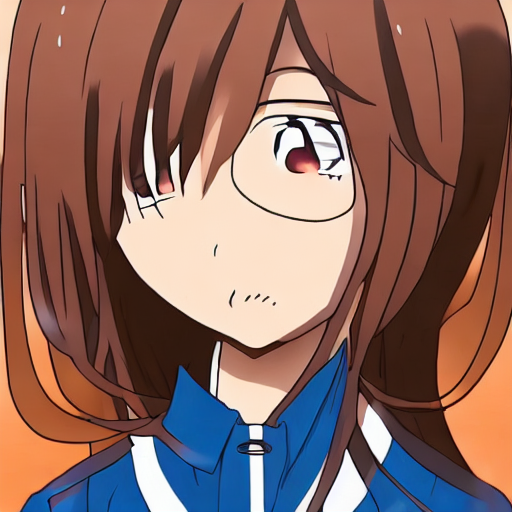

✓ soft_angry
  Prompt: gentle anime girl, rounded eyes, relaxed facial tension, tight mouth, tense eyes, controlled anger, anime style, clean line art



  0%|          | 0/30 [00:00<?, ?it/s]

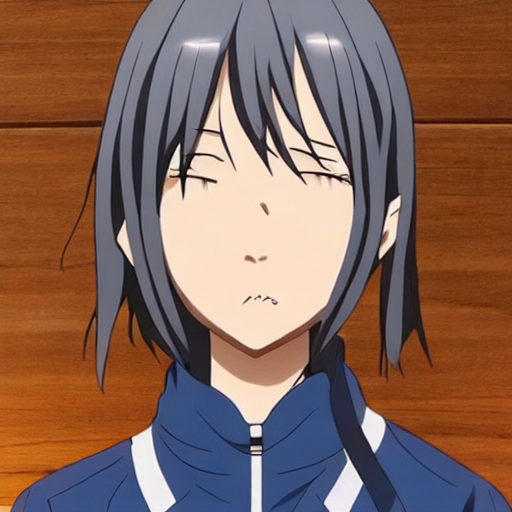

✓ energetic_happy
  Prompt: expressive anime character, wide eyes, dynamic face, soft smile, relaxed eyes, gentle eyebrows, anime style



  0%|          | 0/30 [00:00<?, ?it/s]

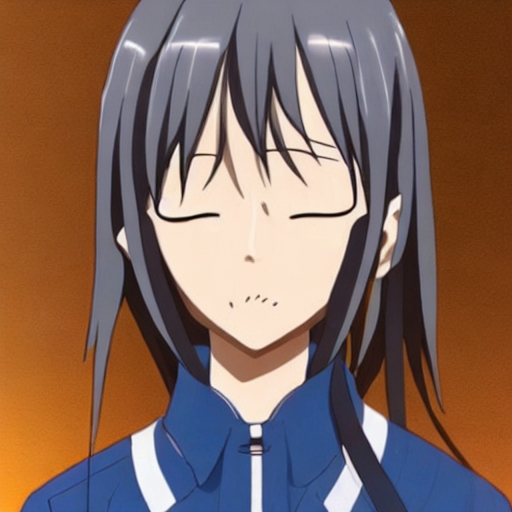

✓ melancholic_happy
  Prompt: sad anime character, drooping eyelids, subtle tension, soft smile, relaxed eyes, gentle eyebrows, anime style


✅ Test generation complete!

These are Priority 1 failure cases from baseline.
Compare these with your baseline images to see improvement!


In [ ]:
# ============================================
# Cell 9: Quick Test Generation
# ============================================

print("\n🎨 Testing trained LoRA...")

# Recreate pipeline with trained LoRA
from diffusers import StableDiffusionPipeline
from peft import PeftModel

test_pipeline = StableDiffusionPipeline.from_pretrained(
    MODEL_ID,
    torch_dtype=torch.float16,
    safety_checker=None
).to("cuda")

# Load LoRA weights using PEFT
test_pipeline.unet = PeftModel.from_pretrained(
    test_pipeline.unet,
    final_path
)

print("✓ LoRA weights loaded")

test_prompts = [
    ("soft_angry", "gentle anime girl, rounded eyes, relaxed facial tension, tight mouth, tense eyes, controlled anger, anime style, clean line art"),
    ("energetic_happy", "expressive anime character, wide eyes, dynamic face, soft smile, relaxed eyes, gentle eyebrows, anime style"),
    ("melancholic_happy", "sad anime character, drooping eyelids, subtle tension, soft smile, relaxed eyes, gentle eyebrows, anime style"),
]

print("\nGenerating test images...")

for name, prompt in test_prompts:
    image = test_pipeline(
        prompt=prompt,
        num_inference_steps=30,
        guidance_scale=7.0,
        generator=torch.Generator("cuda").manual_seed(42)
    ).images[0]

    image.save(f"test_{name}.png")
    from IPython.display import display
    display(image)
    print(f"✓ {name}")
    print(f"  Prompt: {prompt}\n")

print("\n✅ Test generation complete!")
print("\nThese are Priority 1 failure cases from baseline.")
print("Compare these with your baseline images to see improvement!")

🎨 Generating 4 archetypes × 4 emotions × 3 variations = 48 images...
Output directory: test_generation_matrix


Archetype: SOFT


  0%|          | 0/30 [00:00<?, ?it/s]

  ✓ [ 1/48] soft_neutral_v1.png


  0%|          | 0/30 [00:00<?, ?it/s]

  ✓ [ 2/48] soft_neutral_v2.png


  0%|          | 0/30 [00:00<?, ?it/s]

  ✓ [ 3/48] soft_neutral_v3.png


  0%|          | 0/30 [00:00<?, ?it/s]

  ✓ [ 4/48] soft_happy_v1.png


  0%|          | 0/30 [00:00<?, ?it/s]

  ✓ [ 5/48] soft_happy_v2.png


  0%|          | 0/30 [00:00<?, ?it/s]

  ✓ [ 6/48] soft_happy_v3.png


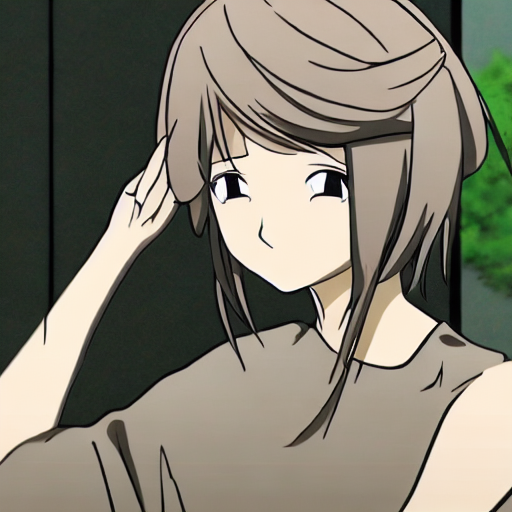

  0%|          | 0/30 [00:00<?, ?it/s]

  ✓ [ 7/48] soft_sad_v1.png


  0%|          | 0/30 [00:00<?, ?it/s]

  ✓ [ 8/48] soft_sad_v2.png


  0%|          | 0/30 [00:00<?, ?it/s]

  ✓ [ 9/48] soft_sad_v3.png


  0%|          | 0/30 [00:00<?, ?it/s]

  ✓ [10/48] soft_angry_v1.png


  0%|          | 0/30 [00:00<?, ?it/s]

  ✓ [11/48] soft_angry_v2.png


  0%|          | 0/30 [00:00<?, ?it/s]

  ✓ [12/48] soft_angry_v3.png


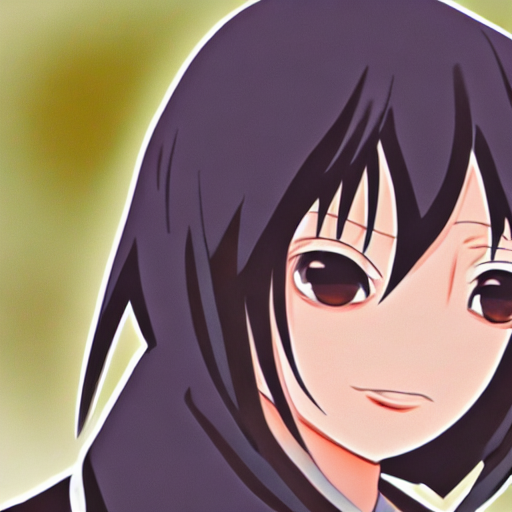


Archetype: STOIC


  0%|          | 0/30 [00:00<?, ?it/s]

  ✓ [13/48] stoic_neutral_v1.png


  0%|          | 0/30 [00:00<?, ?it/s]

  ✓ [14/48] stoic_neutral_v2.png


  0%|          | 0/30 [00:00<?, ?it/s]

  ✓ [15/48] stoic_neutral_v3.png


  0%|          | 0/30 [00:00<?, ?it/s]

  ✓ [16/48] stoic_happy_v1.png


  0%|          | 0/30 [00:00<?, ?it/s]

  ✓ [17/48] stoic_happy_v2.png


  0%|          | 0/30 [00:00<?, ?it/s]

  ✓ [18/48] stoic_happy_v3.png


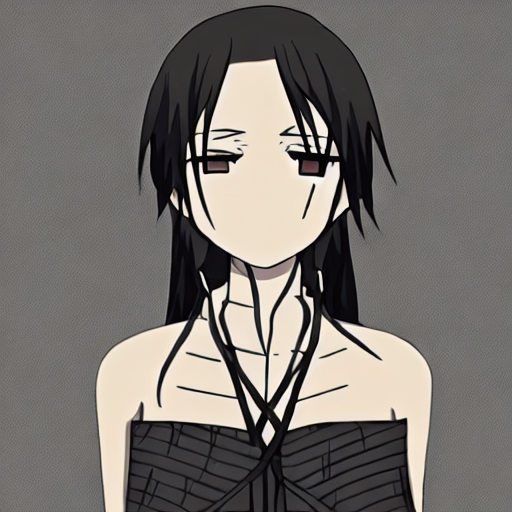

  0%|          | 0/30 [00:00<?, ?it/s]

  ✓ [19/48] stoic_sad_v1.png


  0%|          | 0/30 [00:00<?, ?it/s]

  ✓ [20/48] stoic_sad_v2.png


  0%|          | 0/30 [00:00<?, ?it/s]

  ✓ [21/48] stoic_sad_v3.png


  0%|          | 0/30 [00:00<?, ?it/s]

  ✓ [22/48] stoic_angry_v1.png


  0%|          | 0/30 [00:00<?, ?it/s]

  ✓ [23/48] stoic_angry_v2.png


  0%|          | 0/30 [00:00<?, ?it/s]

  ✓ [24/48] stoic_angry_v3.png


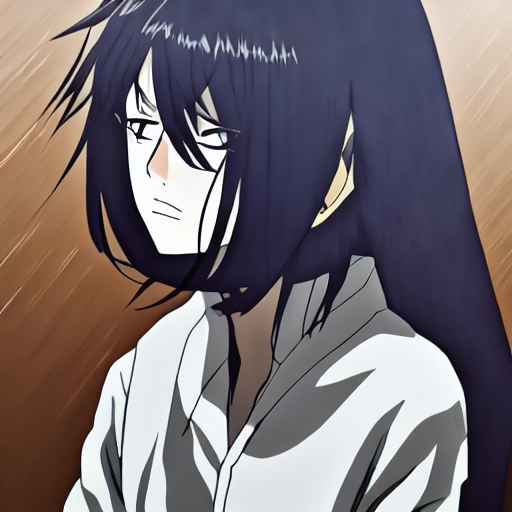


Archetype: ENERGETIC


  0%|          | 0/30 [00:00<?, ?it/s]

  ✓ [25/48] energetic_neutral_v1.png


  0%|          | 0/30 [00:00<?, ?it/s]

  ✓ [26/48] energetic_neutral_v2.png


  0%|          | 0/30 [00:00<?, ?it/s]

  ✓ [27/48] energetic_neutral_v3.png


  0%|          | 0/30 [00:00<?, ?it/s]

  ✓ [28/48] energetic_happy_v1.png


  0%|          | 0/30 [00:00<?, ?it/s]

  ✓ [29/48] energetic_happy_v2.png


  0%|          | 0/30 [00:00<?, ?it/s]

  ✓ [30/48] energetic_happy_v3.png


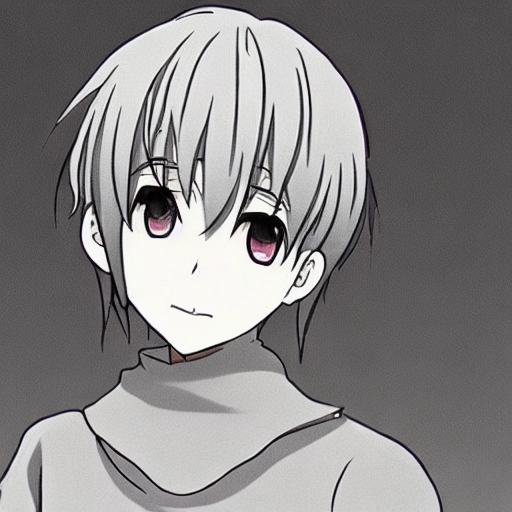

  0%|          | 0/30 [00:00<?, ?it/s]

  ✓ [31/48] energetic_sad_v1.png


  0%|          | 0/30 [00:00<?, ?it/s]

  ✓ [32/48] energetic_sad_v2.png


  0%|          | 0/30 [00:00<?, ?it/s]

  ✓ [33/48] energetic_sad_v3.png


  0%|          | 0/30 [00:00<?, ?it/s]

  ✓ [34/48] energetic_angry_v1.png


  0%|          | 0/30 [00:00<?, ?it/s]

  ✓ [35/48] energetic_angry_v2.png


  0%|          | 0/30 [00:00<?, ?it/s]

  ✓ [36/48] energetic_angry_v3.png


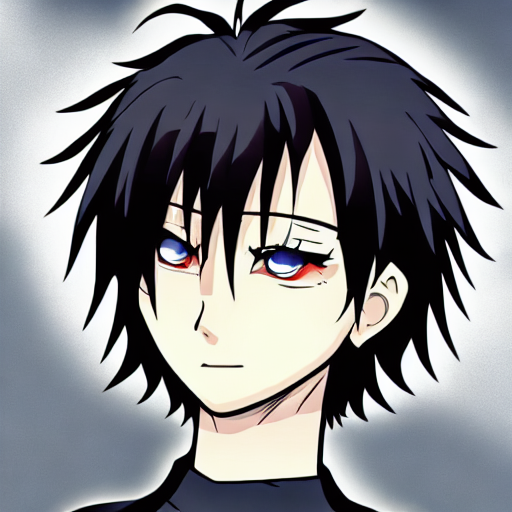


Archetype: MELANCHOLIC


  0%|          | 0/30 [00:00<?, ?it/s]

  ✓ [37/48] melancholic_neutral_v1.png


  0%|          | 0/30 [00:00<?, ?it/s]

  ✓ [38/48] melancholic_neutral_v2.png


  0%|          | 0/30 [00:00<?, ?it/s]

  ✓ [39/48] melancholic_neutral_v3.png


  0%|          | 0/30 [00:00<?, ?it/s]

  ✓ [40/48] melancholic_happy_v1.png


  0%|          | 0/30 [00:00<?, ?it/s]

  ✓ [41/48] melancholic_happy_v2.png


  0%|          | 0/30 [00:00<?, ?it/s]

  ✓ [42/48] melancholic_happy_v3.png


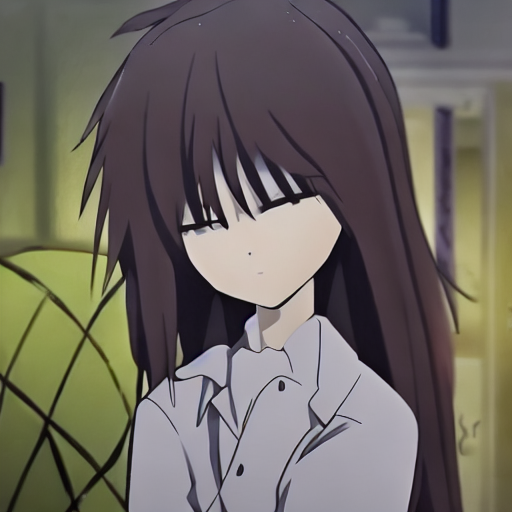

  0%|          | 0/30 [00:00<?, ?it/s]

  ✓ [43/48] melancholic_sad_v1.png


  0%|          | 0/30 [00:00<?, ?it/s]

  ✓ [44/48] melancholic_sad_v2.png


  0%|          | 0/30 [00:00<?, ?it/s]

  ✓ [45/48] melancholic_sad_v3.png


  0%|          | 0/30 [00:00<?, ?it/s]

  ✓ [46/48] melancholic_angry_v1.png


  0%|          | 0/30 [00:00<?, ?it/s]

  ✓ [47/48] melancholic_angry_v2.png


  0%|          | 0/30 [00:00<?, ?it/s]

  ✓ [48/48] melancholic_angry_v3.png


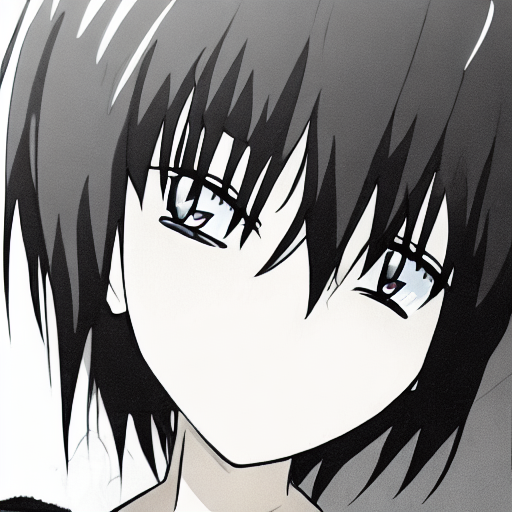


✅ Generation complete! Creating zip file...
📦 ZIP created: test_generation_results.zip
📁 Contains 48 images

File naming pattern: <archetype>_<emotion>_v<1-3>.png
Examples: soft_happy_v1.png, stoic_angry_v2.png, etc.

✅ Download 'test_generation_results.zip' from the Files panel!


In [ ]:
# ============================================
# Cell 10: Generate Test Matrix & Save to ZIP
# ============================================

import os
import zipfile
from PIL import Image
import torch
from IPython.display import display

# Define archetypes
archetypes = {
    "soft": "gentle anime character, rounded eyes, relaxed facial tension",
    "stoic": "cool anime character, narrow eyes, restrained expression",
    "energetic": "expressive anime character, wide eyes, dynamic face",
    "melancholic": "sad anime character, drooping eyelids, subtle tension"
}

# Define emotions (only your 4)
emotions = {
    "neutral": "emotionally neutral, balanced facial expression",
    "happy": "soft smile, relaxed eyes, gentle eyebrows",
    "sad": "lowered gaze, softened mouth, subtle sadness",
    "angry": "tight mouth, tense eyes, controlled anger"
}

# Settings
num_variations = 3  # Generate 3 images per combination
output_dir = "test_generation_matrix"
zip_filename = "test_generation_results.zip"

# Create output directory
os.makedirs(output_dir, exist_ok=True)

total_images = len(archetypes) * len(emotions) * num_variations
print(f"🎨 Generating {len(archetypes)} archetypes × {len(emotions)} emotions × {num_variations} variations = {total_images} images...")
print(f"Output directory: {output_dir}\n")

# Generate all combinations
generated_count = 0
for arch_name, arch_desc in archetypes.items():
    print(f"\n{'='*60}")
    print(f"Archetype: {arch_name.upper()}")
    print(f"{'='*60}")

    for emo_name, emo_desc in emotions.items():
        # Combine archetype + emotion descriptions
        full_prompt = f"{arch_desc}, {emo_desc}, anime style, clean line art"

        # Generate multiple variations
        for variation in range(num_variations):
            # Generate image with unique seed
            image = test_pipeline(
                prompt=full_prompt,
                num_inference_steps=30,
                guidance_scale=7.0,
                generator=torch.Generator("cuda").manual_seed(42 + generated_count)
            ).images[0]

            # Save image with variation number
            filename = f"{arch_name}_{emo_name}_v{variation+1}.png"
            filepath = os.path.join(output_dir, filename)
            image.save(filepath)

            generated_count += 1
            print(f"  ✓ [{generated_count:2d}/{total_images}] {filename}")

            # Display every 6th image
            if generated_count % 6 == 0:
                display(image)

print(f"\n{'='*60}")
print(f"✅ Generation complete! Creating zip file...")

# Create zip file
with zipfile.ZipFile(zip_filename, 'w', zipfile.ZIP_DEFLATED) as zipf:
    for filename in os.listdir(output_dir):
        filepath = os.path.join(output_dir, filename)
        zipf.write(filepath, filename)

print(f"📦 ZIP created: {zip_filename}")
print(f"📁 Contains {generated_count} images")
print(f"\nFile naming pattern: <archetype>_<emotion>_v<1-3>.png")
print(f"Examples: soft_happy_v1.png, stoic_angry_v2.png, etc.")
print(f"\n✅ Download '{zip_filename}' from the Files panel!")

🎨 Generating 4 × 12 = 48 images...
Output directory: test_generation_matrix


Archetype: SOFT


  0%|          | 0/30 [00:00<?, ?it/s]

  ✓ [ 1/48] soft_neutral.png


  0%|          | 0/30 [00:00<?, ?it/s]

  ✓ [ 2/48] soft_happy.png


  0%|          | 0/30 [00:00<?, ?it/s]

  ✓ [ 3/48] soft_sad.png


  0%|          | 0/30 [00:00<?, ?it/s]

  ✓ [ 4/48] soft_angry.png


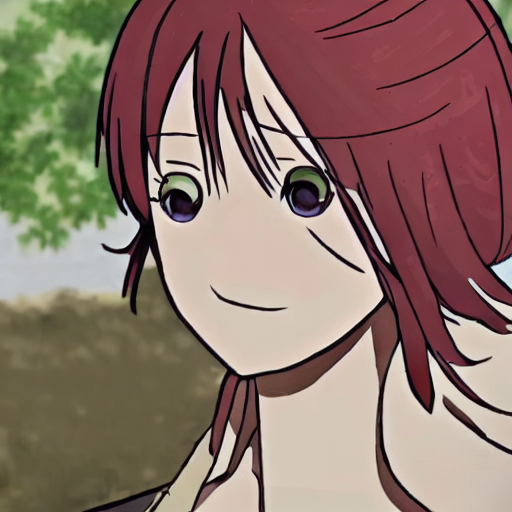

  0%|          | 0/30 [00:00<?, ?it/s]

  ✓ [ 5/48] soft_surprised.png


  0%|          | 0/30 [00:00<?, ?it/s]

  ✓ [ 6/48] soft_disgusted.png


  0%|          | 0/30 [00:00<?, ?it/s]

  ✓ [ 7/48] soft_fearful.png


  0%|          | 0/30 [00:00<?, ?it/s]

  ✓ [ 8/48] soft_contemptuous.png


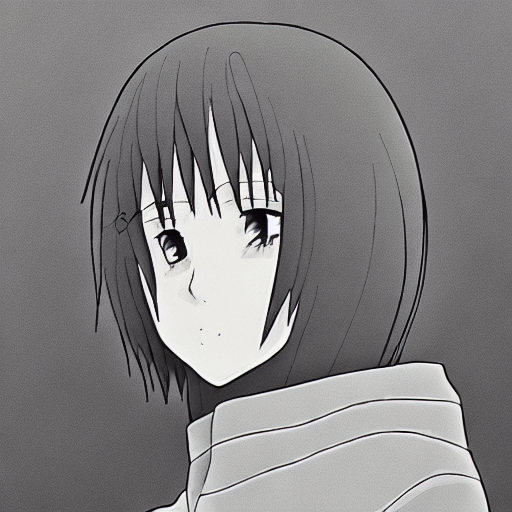

  0%|          | 0/30 [00:00<?, ?it/s]

  ✓ [ 9/48] soft_excited.png


  0%|          | 0/30 [00:00<?, ?it/s]

  ✓ [10/48] soft_bored.png


  0%|          | 0/30 [00:00<?, ?it/s]

  ✓ [11/48] soft_anxious.png


  0%|          | 0/30 [00:00<?, ?it/s]

  ✓ [12/48] soft_confused.png


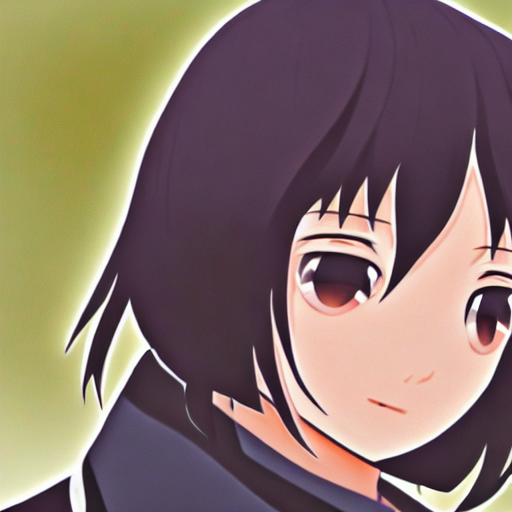


Archetype: STOIC


  0%|          | 0/30 [00:00<?, ?it/s]

  ✓ [13/48] stoic_neutral.png


  0%|          | 0/30 [00:00<?, ?it/s]

  ✓ [14/48] stoic_happy.png


  0%|          | 0/30 [00:00<?, ?it/s]

  ✓ [15/48] stoic_sad.png


  0%|          | 0/30 [00:00<?, ?it/s]

  ✓ [16/48] stoic_angry.png


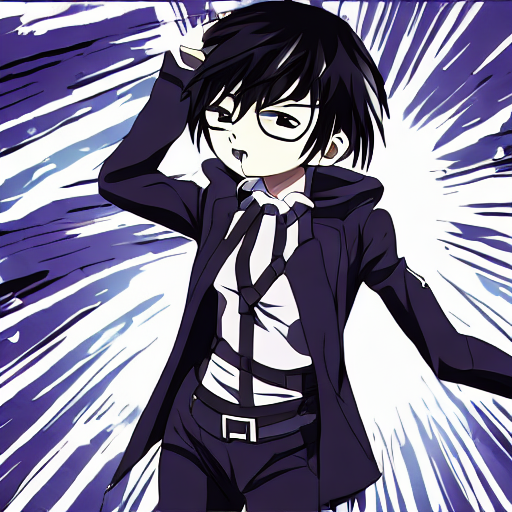

  0%|          | 0/30 [00:00<?, ?it/s]

  ✓ [17/48] stoic_surprised.png


  0%|          | 0/30 [00:00<?, ?it/s]

  ✓ [18/48] stoic_disgusted.png


  0%|          | 0/30 [00:00<?, ?it/s]

  ✓ [19/48] stoic_fearful.png


  0%|          | 0/30 [00:00<?, ?it/s]

  ✓ [20/48] stoic_contemptuous.png


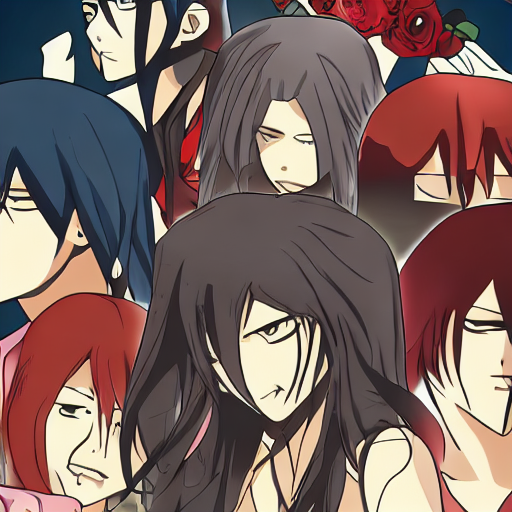

  0%|          | 0/30 [00:00<?, ?it/s]

  ✓ [21/48] stoic_excited.png


  0%|          | 0/30 [00:00<?, ?it/s]

  ✓ [22/48] stoic_bored.png


  0%|          | 0/30 [00:00<?, ?it/s]

  ✓ [23/48] stoic_anxious.png


  0%|          | 0/30 [00:00<?, ?it/s]

  ✓ [24/48] stoic_confused.png


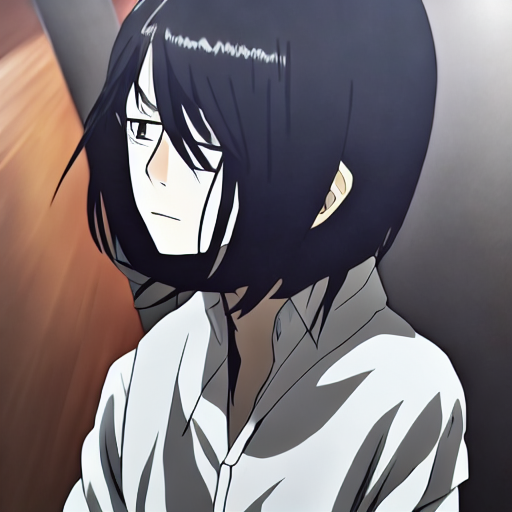


Archetype: ENERGETIC


  0%|          | 0/30 [00:00<?, ?it/s]

  ✓ [25/48] energetic_neutral.png


  0%|          | 0/30 [00:00<?, ?it/s]

  ✓ [26/48] energetic_happy.png


  0%|          | 0/30 [00:00<?, ?it/s]

  ✓ [27/48] energetic_sad.png


  0%|          | 0/30 [00:00<?, ?it/s]

  ✓ [28/48] energetic_angry.png


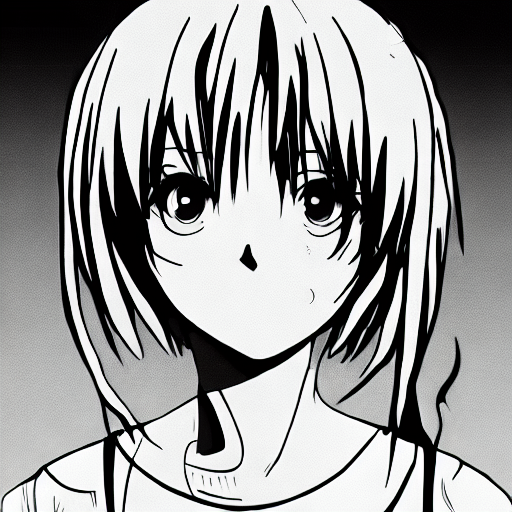

  0%|          | 0/30 [00:00<?, ?it/s]

  ✓ [29/48] energetic_surprised.png


  0%|          | 0/30 [00:00<?, ?it/s]

  ✓ [30/48] energetic_disgusted.png


  0%|          | 0/30 [00:00<?, ?it/s]

  ✓ [31/48] energetic_fearful.png


  0%|          | 0/30 [00:00<?, ?it/s]

  ✓ [32/48] energetic_contemptuous.png


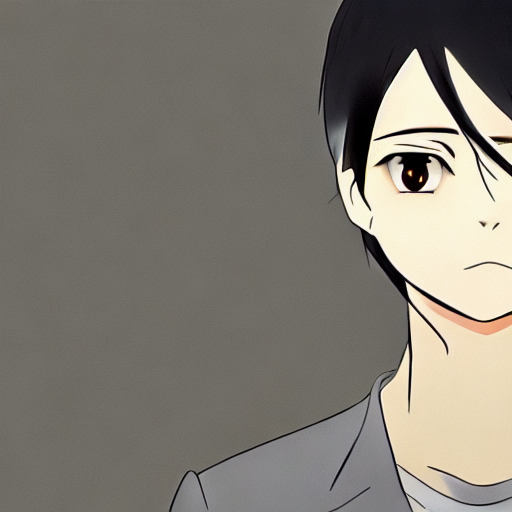

  0%|          | 0/30 [00:00<?, ?it/s]

  ✓ [33/48] energetic_excited.png


  0%|          | 0/30 [00:00<?, ?it/s]

  ✓ [34/48] energetic_bored.png


  0%|          | 0/30 [00:00<?, ?it/s]

  ✓ [35/48] energetic_anxious.png


  0%|          | 0/30 [00:00<?, ?it/s]

  ✓ [36/48] energetic_confused.png


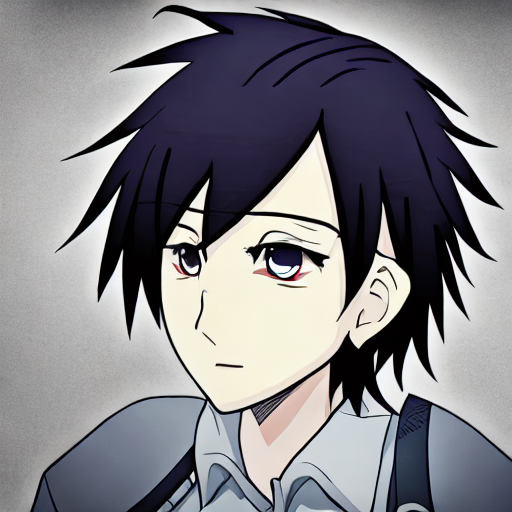


Archetype: MELANCHOLIC


  0%|          | 0/30 [00:00<?, ?it/s]

  ✓ [37/48] melancholic_neutral.png


  0%|          | 0/30 [00:00<?, ?it/s]

  ✓ [38/48] melancholic_happy.png


  0%|          | 0/30 [00:00<?, ?it/s]

  ✓ [39/48] melancholic_sad.png


  0%|          | 0/30 [00:00<?, ?it/s]

  ✓ [40/48] melancholic_angry.png


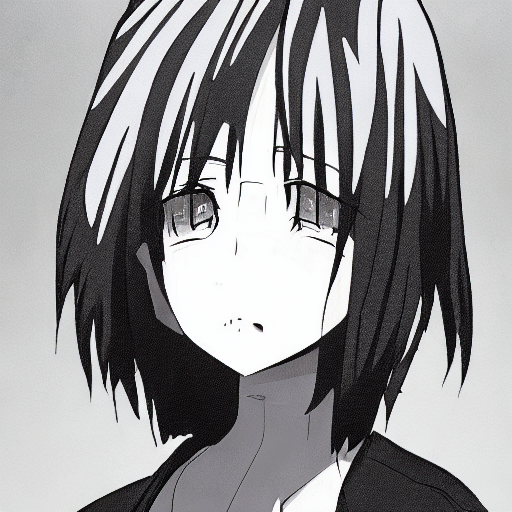

  0%|          | 0/30 [00:00<?, ?it/s]

  ✓ [41/48] melancholic_surprised.png


  0%|          | 0/30 [00:00<?, ?it/s]

  ✓ [42/48] melancholic_disgusted.png


  0%|          | 0/30 [00:00<?, ?it/s]

  ✓ [43/48] melancholic_fearful.png


  0%|          | 0/30 [00:00<?, ?it/s]

  ✓ [44/48] melancholic_contemptuous.png


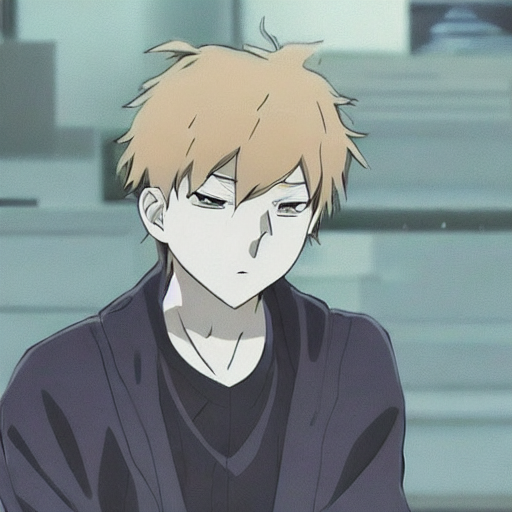

  0%|          | 0/30 [00:00<?, ?it/s]

  ✓ [45/48] melancholic_excited.png


  0%|          | 0/30 [00:00<?, ?it/s]

  ✓ [46/48] melancholic_bored.png


  0%|          | 0/30 [00:00<?, ?it/s]

  ✓ [47/48] melancholic_anxious.png


  0%|          | 0/30 [00:00<?, ?it/s]

  ✓ [48/48] melancholic_confused.png


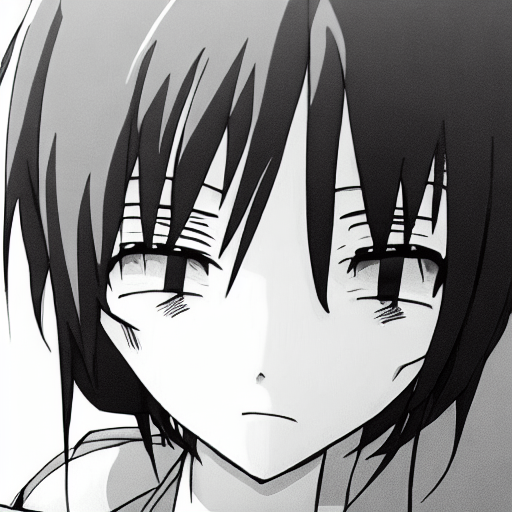


✅ Generation complete!
📁 All 48 images saved to: test_generation_matrix/

File naming pattern: <archetype>_<emotion>.png
Example: soft_happy.png, stoic_angry.png, etc.


In [ ]:
# ============================================
# Cell 10: Generate Full Test Matrix (48 Images)
# ============================================

import os
from PIL import Image
import torch
from IPython.display import display

# Define archetypes
archetypes = {
    "soft": "gentle anime character, rounded eyes, relaxed facial tension",
    "stoic": "cool anime character, narrow eyes, restrained expression",
    "energetic": "expressive anime character, wide eyes, dynamic face",
    "melancholic": "sad anime character, drooping eyelids, subtle tension"
}

# Define emotions
emotions = {
    "neutral": "emotionally neutral, balanced facial expression",
    "happy": "soft smile, relaxed eyes, gentle eyebrows",
    "sad": "lowered gaze, softened mouth, subtle sadness",
    "angry": "tight mouth, tense eyes, controlled anger",
    "surprised": "raised eyebrows, wide eyes, open mouth",
    "disgusted": "wrinkled nose, narrowed eyes, slight frown",
    "fearful": "wide eyes, tense brows, slightly open mouth",
    "contemptuous": "raised corner of mouth, narrowed eyes, smirk",
    "excited": "bright eyes, wide smile, energetic expression",
    "bored": "half-closed eyes, slack jaw, listless expression",
    "anxious": "furrowed brows, tense jaw, worried eyes",
    "confused": "tilted head, raised eyebrow, questioning expression"
}

# Create output directory
output_dir = "test_generation_matrix"
os.makedirs(output_dir, exist_ok=True)

print(f"🎨 Generating {len(archetypes)} × {len(emotions)} = {len(archetypes) * len(emotions)} images...")
print(f"Output directory: {output_dir}\n")

# Generate all combinations
generated_count = 0
for arch_name, arch_desc in archetypes.items():
    print(f"\n{'='*60}")
    print(f"Archetype: {arch_name.upper()}")
    print(f"{'='*60}")

    for emo_name, emo_desc in emotions.items():
        # Combine archetype + emotion descriptions
        full_prompt = f"{arch_desc}, {emo_desc}, anime style, clean line art"

        # Generate image
        image = test_pipeline(
            prompt=full_prompt,
            num_inference_steps=30,
            guidance_scale=7.0,
            generator=torch.Generator("cuda").manual_seed(42 + generated_count)  # Different seed per image
        ).images[0]

        # Save image
        filename = f"{arch_name}_{emo_name}.png"
        filepath = os.path.join(output_dir, filename)
        image.save(filepath)

        generated_count += 1
        print(f"  ✓ [{generated_count:2d}/48] {filename}")

        # Optional: Display every 4th image to avoid overwhelming the notebook
        if generated_count % 4 == 0:
            display(image)

print(f"\n{'='*60}")
print(f"✅ Generation complete!")
print(f"📁 All {generated_count} images saved to: {output_dir}/")
print(f"\nFile naming pattern: <archetype>_<emotion>.png")
print(f"Example: soft_happy.png, stoic_angry.png, etc.")